# Fixed Scale Spatial Smoothing Filter on OISST (gcm-filters)

This notebook pre-processes the observational SST data by applying fixed scale length spatial smoothing filters via gcm-filters. It creates and saves data sets smoothed with different filter scales: 75, 150, and 300 km. The notebook then opens and plots the saved SST datasets.

*Note: Used a cloned NPL 2025a environment with gcm-filters installed.*

## Import Libraries

In [1]:
import sys
print(sys.executable)

/glade/u/home/anyalee/.conda/envs/gcm-filters-env/bin/python


In [2]:
# Import libraries
import cartopy.crs as ccrs
import dask.array as da
from dask.distributed import LocalCluster, Client
import gcm_filters
import glob
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import warnings
import xarray as xr
warnings.filterwarnings('ignore')
xr.set_options(display_expand_data=False);

## Load the Data

In [3]:
cluster = LocalCluster()
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/8787/status,Workers: 6
Total threads: 36,Total memory: 384.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44127,Workers: 6
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/8787/status,Total threads: 36
Started: Just now,Total memory: 384.00 GiB
Comm: tcp://127.0.0.1:46051,Total threads: 6
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/45699/status,Memory: 64.00 GiB
Nanny: tcp://127.0.0.1:35037,


In [4]:
# Read in data

# Get list of .nc files, excluding "preliminary" ones
file_list = glob.glob('/glade/campaign/univ/ucub0175/OISST/*.nc')
file_list = [file_name for file_name in file_list if "preliminary" not in file_name]

# files in list are not in order by date
print(f"Path of first file in file_list: {file_list[0]}")

file_list_sorted = sorted(file_list)
print(f"Path of first file in sorted file_list: {file_list_sorted[0]}")

print(f"Found {len(file_list)} files")
# 15979 files without preliminary
# 15993 total files

Path of first file in file_list: /glade/campaign/univ/ucub0175/OISST/oisst-avhrr-v02r01.19911020.nc
Path of first file in sorted file_list: /glade/campaign/univ/ucub0175/OISST/oisst-avhrr-v02r01.19810901.nc
Found 15979 files


In [5]:
%%time
# Create SST xarray.Dataset (dask when specify chunks)
ds_sst = xr.open_mfdataset(
    file_list_sorted,
    concat_dim='time',
    combine='nested',
    parallel=True,           # use dask to load in parallel
    preprocess=lambda ds: ds[['sst']],  # only keep SST variable
    chunks={'lat': 120, 'lon': 240},
    engine='netcdf4'
)

/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/dask/utils.py:77: UserWarning: The specified chunks separate the stored chunks along dimension "lat" starting at index 120. This could degrade performance. Instead, consider rechunking after loading.
  return func(*args, **kwargs)
/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/dask/utils.py:77: UserWarning: The specified chunks separate the stored chunks along dimension "lon" starting at index 240. This could degrade performance. Instead, consider rechunking after loading.
  return func(*args, **kwargs)
/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/dask/utils.py:77: UserWarning: The specified chunks separate the stored chunks along dimension "lat" starting at index 120. This could degrade performance. Instead, consider rechunking after loading.
  return func(*args, **kwargs)
/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-

CPU times: user 52.3 s, sys: 3.18 s, total: 55.5 s
Wall time: 1min 17s


In [6]:
# Check time range
print(ds_sst['time'].values[0], ds_sst['time'].values[-1])
# 1981-09-01 to 2025-06-01

1981-09-01T12:00:00.000000000 2025-06-01T12:00:00.000000000


In [7]:
ds_sst = ds_sst.squeeze('zlev')
ds_sst

<xarray.Dataset> Size: 66GB
Dimensions:  (time: 15979, lat: 720, lon: 1440)
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * time     (time) datetime64[ns] 128kB 1981-09-01T12:00:00 ... 2025-06-01T1...
    zlev     float32 4B 0.0
Data variables:
    sst      (time, lat, lon) float32 66GB dask.array<chunksize=(1, 120, 240), meta=np.ndarray>
Attributes: (12/37)
    title:                      NOAA/NCEI 1/4 Degree Daily Optimum Interpolat...
    source:                     ICOADS, NCEP_GTS, GSFC_ICE, NCEP_ICE, Pathfin...
    id:                         oisst-avhrr-v02r01.19810901.nc
    naming_authority:           gov.noaa.ncei
    summary:                    NOAAs 1/4-degree Daily Optimum Interpolation ...
    cdm_data_type:              Grid
    ...                         ...
    metadata_link:              https://doi.org/10.25921/RE9P-PT57
    ncei_template_version:      NCEI_NetCDF_Grid_Template_v2.0
    comment:                    Data was converted from NetCDF-3 to NetCDF-4 ...
    sensor:                     Thermometer, AVHRR
    Conventions:                CF-1.6, ACDD-1.3
    references:                 Reynolds, et al.(2007) Daily High-Resolution-...

In [8]:
print(ds_sst)

<xarray.Dataset> Size: 66GB
Dimensions:  (time: 15979, lat: 720, lon: 1440)
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * time     (time) datetime64[ns] 128kB 1981-09-01T12:00:00 ... 2025-06-01T1...
    zlev     float32 4B 0.0
Data variables:
    sst      (time, lat, lon) float32 66GB dask.array<chunksize=(1, 120, 240), meta=np.ndarray>
Attributes: (12/37)
    title:                      NOAA/NCEI 1/4 Degree Daily Optimum Interpolat...
    source:                     ICOADS, NCEP_GTS, GSFC_ICE, NCEP_ICE, Pathfin...
    id:                         oisst-avhrr-v02r01.19810901.nc
    naming_authority:           gov.noaa.ncei
    summary:                    NOAAs 1/4-degree Daily Optimum Interpolation ...
    cdm_data_type:              Grid
    ...                         ...
    metadata_link:              https://doi.org/10.25921/RE9P-PT57
    ncei_template_ve

In [10]:
# da_sst = ds_sst['sst'].squeeze('zlev')
# da_sst  # xarray Dataset

In [11]:
# print(ds_sst)

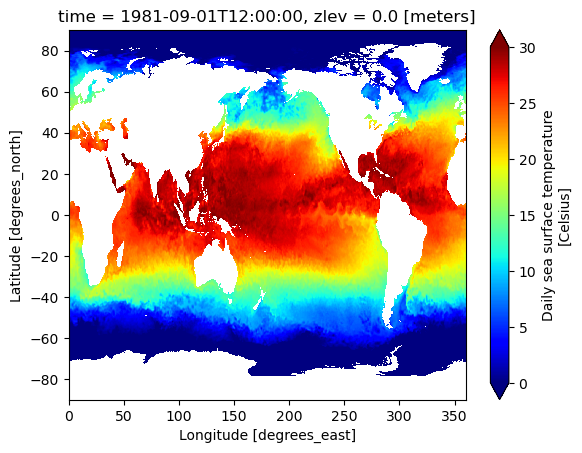

In [9]:
ds_sst.sst.isel(time=0).plot(vmin=0,vmax=30,cmap='jet'); plt.show()

## Spatial Smoothing Filter

Now let's apply the Gaussian filter using the gcm-filters package.

In [12]:
# Replace fill values (-999s) with NaN
# for wet mask bellow
ds_sst['sst'] = ds_sst['sst'].where(ds_sst['sst'] != -999, np.nan)

# Convert to dask array; required for gcm_filters
# Rechunks so that lat and lon are each in a single chunk
ds_sst = ds_sst.chunk({"lat": -1, "lon": -1})

In [13]:
gcm_filters.required_grid_vars(gcm_filters.GridType.IRREGULAR_WITH_LAND)

['wet_mask', 'dxw', 'dyw', 'dxs', 'dys', 'area', 'kappa_w', 'kappa_s']

In [14]:
# Compute cell area
# for each lat/lon grid box gcm-filters needs area in same format as du,dv
# compute dx and dy in km
# For latitude: 90 degrees = 10000 Km (North Pole to Equator); 1 lat minute (nautical mile) = 1.852 Km
# For longitude: Same as above, but multiply the result by cos(latitude) as longitude lines converge at North pole

# Note: dy0 is a constant over the globe
dy0_sst = 1852*60*np.abs(ds_sst['lat'][2].data - ds_sst['lat'][1].data) # in km
dx0_sst = 1852*60*np.cos(np.deg2rad(ds_sst['lat'].data))*(ds_sst['lon'][2].data - ds_sst['lon'][1].data) 

area = dy0_sst*np.tile(dx0_sst, (len(ds_sst['lon'].data),1))
area = np.transpose(area)

# wrap in dataArray
dA_sst = xr.DataArray(
    data=area,
    dims=("lat", "lon"),
    coords={"lon":ds_sst['lon'].data, "lat":ds_sst['lat'].data}
)

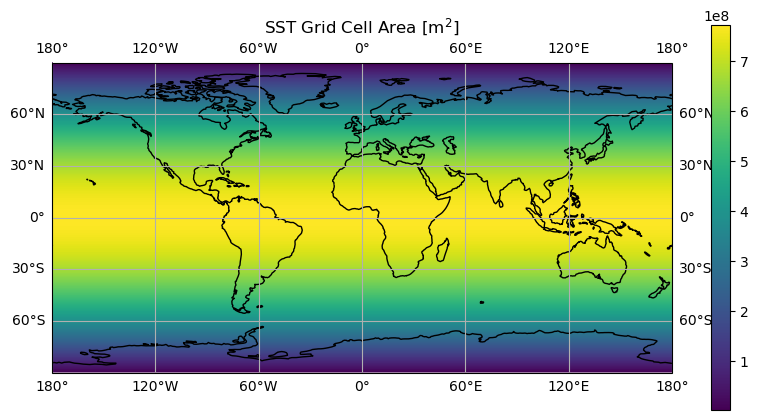

In [15]:
area_cmap = 'viridis'  # colormap

fig, ax = plt.subplots(
    1, 1,
    figsize=(10, 5),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

dA_sst.plot(ax=ax, cmap=area_cmap)
ax.set_title('SST Grid Cell Area [m$^2$]')
ax.coastlines()

gl = ax.gridlines(draw_labels=True)
gl.xlabels_top = False
gl.ylabels_right = False

plt.show()

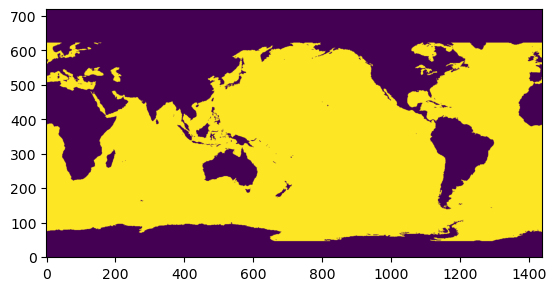

In [16]:
# Wet mask: land = 0, water = 1
sst_mask = xr.where(np.isnan(ds_sst['sst'].isel(time=0)), 0, 1)
highlats_mask = xr.where((ds_sst['lat'] >= 65) , 0, 1)
# didn't include "| (ds_lhf['latitude'] <= -70)" in highlats mask

wet_mask = sst_mask & highlats_mask
plt.imshow(wet_mask, origin='lower')
plt.show()

In [17]:
# Grid variable: dxw, dyw, dxs, dys
# dxw, dyw, dxs, dys
# only computed for SST as LHF grid is the same
latc = ds_sst['lat'].values
lonc = ds_sst['lon'].values
xc, yc = np.meshgrid(lonc,latc, indexing='xy') # grid cell centre coords

# dys
temp = yc - np.roll(yc, 1, axis=0); temp[0,:] = temp[0,:] + 180 
dys_a = 1852*60*temp
dys = xr.DataArray(
    data=dys_a, 
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat","lon"]
)

# dxw
temp = xc - np.roll(xc,1,axis=1); temp[:,0] = temp[:,0] + 360
dxw_a = 1852*60*np.cos(np.deg2rad(yc))*temp
dxw = xr.DataArray(
    data=dxw_a, 
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat", "lon"]
)

# for dxs and dyw, compute the cell vertices
late = [(latc[i]+latc[i+1])/2 for i in range(len(latc)-1)]
late.insert(len(late),90); late.insert(0,-90)
late = np.asarray(late);

lone = [(lonc[i]+lonc[i+1])/2 for i in range(len(lonc)-1)]
lone.insert(len(lone),360); lone.insert(0,0)
lone = np.asarray(lone)

xe, ye = np.meshgrid(lone, late, indexing='xy')

# dyw
dyw_a = 1852*60*np.diff(ye[:,:-1], axis=0)
dyw = xr.DataArray(
    data=dyw_a, 
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat", "lon"]
)

# dxs
dxs_a = 1852*60*np.cos(np.deg2rad(ye[1:,:-1]))*np.diff(xe[1:,:],axis=1)
dxs = xr.DataArray(
    data=dxs_a, 
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat", "lon"]
)

In [18]:
# dx_min
dx_min_ = min(dxw.where(wet_mask).min().values, dyw.where(wet_mask).min().values,
              dxs.where(wet_mask).min().values, dys.where(wet_mask).min().values)
print(dx_min_)  # 5597.817741930485

5597.817741930485


In [19]:
# Finally set kappa_w and kappa_s
# here we set them to 1 as we don't vary the filter size spatially
kappa_w = xr.ones_like(dxw)
kappa_s = xr.ones_like(dxw)

In [20]:
# Create grid variable dict
grid_vars = {
    'wet_mask': wet_mask,
    'dxw': dxw,
    'dyw': dyw,
    'dxs': dxs,
    'dys': dys,
    'area': dA_sst,
    'kappa_w': kappa_w,
    'kappa_s': kappa_s
}

In [21]:
filter_scale = 75000   # in meters

filter = gcm_filters.Filter(
        filter_scale=filter_scale,  # meters
        dx_min=dx_min_,             # meters
        filter_shape=gcm_filters.FilterShape.GAUSSIAN,  # Gaussian
        grid_type=gcm_filters.GridType.IRREGULAR_WITH_LAND,  # needs wet_mask
        grid_vars=grid_vars
)

filter

Filter(filter_scale=75000, dx_min=array(5597.81774193), filter_shape=<FilterShape.GAUSSIAN: 1>, transition_width=3.141592653589793, ndim=2, n_steps=15, grid_type=<GridType.IRREGULAR_WITH_LAND: 5>)

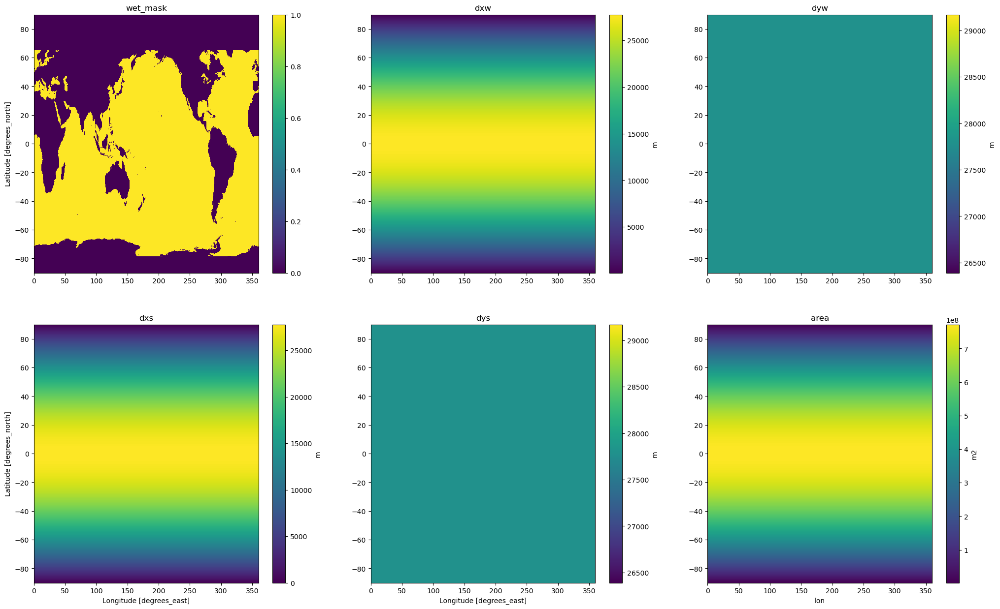

In [22]:
# plot a summary of the filtering inputs
fig,axs = plt.subplots(2,3,figsize=(25,15))
wet_mask.plot(ax=axs[0,0], cbar_kwargs={'label': ''})
axs[0,0].set(title='wet_mask', xlabel='')
dxw.plot(ax=axs[0,1], cbar_kwargs={'label': 'm'})
axs[0,1].set(title='dxw', xlabel='', ylabel='')
dyw.plot(ax=axs[0,2], cbar_kwargs={'label': 'm'})
axs[0,2].set(title='dyw', xlabel='', ylabel='')
dxs.plot(ax=axs[1,0], cbar_kwargs={'label': 'm'})
axs[1,0].set(title='dxs')
dys.plot(ax=axs[1,1], cbar_kwargs={'label': 'm'})
axs[1,1].set(title='dys', ylabel='')
dA_sst.plot(ax=axs[1,2], cbar_kwargs={'label': 'm2'})
axs[1,2].set(title='area', ylabel='');

plt.show()

In [23]:
# Test at specific point
sst_full = ds_sst['sst'].isel(time=0)
sst_filtered = filter.apply(sst_full, dims=['lat','lon'])
sst_full

<xarray.DataArray 'sst' (lat: 720, lon: 1440)> Size: 4MB
dask.array<chunksize=(720, 1440), meta=np.ndarray>
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
    time     datetime64[ns] 8B 1981-09-01T12:00:00
    zlev     float32 4B 0.0
Attributes:
    long_name:  Daily sea surface temperature
    units:      Celsius
    valid_min:  -300
    valid_max:  4500

In [24]:
# plot a given dataarray on a given axis object
def plot_map(ax, da, vmin=-999, vmax=999, units='units',
             lon='geolon', lat='geolat', cmap='RdBu_r', title='My Plot'):
    
    p = da.plot(ax=ax, x=lon, y=lat, vmin=vmin, vmax=vmax, cmap=cmap, 
                transform=ccrs.PlateCarree(), add_labels=False, add_colorbar=False)
    
    # add separate colorbar
    cb = plt.colorbar(p, ax=ax, extend='both', orientation="vertical", shrink=0.9)
    cb.ax.tick_params(labelsize=12)
    cb.ax.set_ylabel(units, rotation=270)
    
    # add gridlines
    p.axes.gridlines(color='black', alpha=0.5, linestyle='--')
    
    # set the axis extent based on the area of interest and the reference 
    # coordinate system for interpreting the extent. Comment this if global 
    # map is desired.
    #p.axes.set_extent([-300, 60, 75, 90], ccrs.PlateCarree())
    
    _ = plt.title(title, fontsize=14)
    return fig

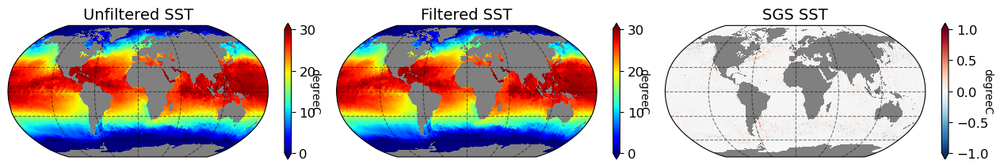

In [25]:
# plot SST
fig = plt.figure(figsize=[16,5])

# define the grid 
grid_ = plt.GridSpec(2, 3, wspace=0.01, hspace=0.01)

# subplot keyword arguments
subplot_kws=dict(projection=ccrs.Robinson(),facecolor='grey')

################ SST ################
# define the colorbar limits and the unit
cb_min = 0; cb_max = 30
units = 'degreeC'

# Unfiltered SST
ax = fig.add_subplot(grid_[0, 0], **subplot_kws)
_ = plot_map(ax, sst_full, vmin=cb_min, vmax=cb_max, 
             units=units, lon='lon', lat='lat', cmap='jet', 
             title=r'Unfiltered SST')
# Filtered SST
ax = fig.add_subplot(grid_[0, 1], **subplot_kws)
_ = plot_map(ax, sst_filtered, vmin=cb_min, vmax=cb_max, units=units, 
             lon='lon', lat='lat', cmap='jet', 
             title=r'Filtered SST')
# SGS SST
cb_min = -1; cb_max = 1
ax = fig.add_subplot(grid_[0, 2], **subplot_kws)
_ = plot_map(ax, sst_full - sst_filtered, vmin=cb_min, vmax=cb_max, 
             units=units, lon='lon', lat='lat', cmap='RdBu_r', 
             title=r'SGS SST')

## Loop Through Each Filter Scale and Save Datasets as NetCDFs

In [26]:
def apply_filter(sst_field, filter_scale):

    # Create filter
    filter = gcm_filters.Filter(
        filter_scale=filter_scale,   # meters
        dx_min=dx_min_,              # meters
        filter_shape=gcm_filters.FilterShape.GAUSSIAN,  # Gaussian
        grid_type=gcm_filters.GridType.IRREGULAR_WITH_LAND,  # needs wet_mask
        grid_vars=grid_vars
    )

    # Apply filter
    filtered = filter.apply(sst_field, dims=["lat", "lon"])

    return filtered

In [27]:
# Set output directory for saved datasets
output_dir = "/glade/campaign/univ/ucub0175/OISST_smoothed/"
os.makedirs(output_dir, exist_ok=True)

In [28]:
# Define filter scales
filter_scales_L = [75000, 150000, 300000]  # 75, 150, 300 km

# Full SST data
sst_full = ds_sst['sst']
sst_full

<xarray.DataArray 'sst' (time: 15979, lat: 720, lon: 1440)> Size: 66GB
dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * time     (time) datetime64[ns] 128kB 1981-09-01T12:00:00 ... 2025-06-01T1...
    zlev     float32 4B 0.0
Attributes:
    long_name:  Daily sea surface temperature
    units:      Celsius
    valid_min:  -300
    valid_max:  4500

In [29]:
%%time

L = 300000
L_km = int(L / 1000)
print(f"Applying filter with L={L_km} km...")

# Create filter and apply lazily 
sst_filtered_lazy = apply_filter(sst_full, filter_scale=L)

# Create dataset and compute
ds_filtered = xr.Dataset({f"sst_L{L_km}km": sst_filtered_lazy}).compute()

# Save to NetCDF
output_path = os.path.join(output_dir, f"oisst_filtered_L{L_km}km.nc")
print(f"Saving to: {output_path}")
ds_filtered.to_netcdf(output_path)

Applying filter with L=300 km...
Saving to: /glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L300km.nc
CPU times: user 27min 58s, sys: 3min 19s, total: 31min 17s
Wall time: 1h 12min 42s


In [ ]:
# %%time

# for L in filter_scales_L:
#     L_km = int(L / 1000)
#     print(f"Applying filter with L={L_km} km...")

#     # Create filter and apply lazily 
#     sst_filtered_lazy = apply_filter(sst_full, filter_scale=L)

#     # Create dataset and compute
#     ds_filtered = xr.Dataset({f"sst_L{L_km}km": sst_filtered_lazy}).compute()

#     # Save to NetCDF
#     output_path = os.path.join(output_dir, f"oisst_filtered_L{L_km}km.nc")
#     print(f"Saving to: {output_path}")
#     ds_filtered.to_netcdf(output_path)

Applying filter with L=75 km...
Saving to: /glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L75km.nc
Applying filter with L=150 km...


[crhtc116:40128:0:40189] Caught signal 11 (Segmentation fault: address not mapped to object at address 0x154ea58d5018)
==== backtrace (tid:  40189) ====
 0  /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/h5py/../../../././libucs.so.0(ucs_handle_error+0x305) [0x154eb0b5f015]
 1  /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/h5py/../../../././libucs.so.0(+0x2f214) [0x154eb0b5f214]
 2  /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/h5py/../../../././libucs.so.0(+0x2f3da) [0x154eb0b5f3da]
 3  /lib64/libpthread.so.0(+0x16910) [0x154eef7a9910]
 4  /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/netCDF4/../../../libnetcdf.so.19(add_to_NCList+0x2e) [0x154ea04f790e]
 5  /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/netCDF4/../../../libnetcdf.so.19(NC_open+0x29c) [0x154ea04e43ac]
 6  /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/

Saving to: /glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L150km.nc
Applying filter with L=300 km...


2025-07-18 15:08:05,703 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('filter_func-filter_func_0-transpose-fc718dc5543f49544f12e73a329730d2', 930, 0, 0))" coro=<Worker.execute() done, defined at /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/distributed/worker_state_machine.py:3606>> ended with CancelledError
2025-07-18 15:08:05,704 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('filter_func-filter_func_0-transpose-fc718dc5543f49544f12e73a329730d2', 9287, 0, 0))" coro=<Worker.execute() done, defined at /glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/distributed/worker_state_machine.py:3606>> ended with CancelledError
2025-07-18 15:08:05,704 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('filter_func-filter_func_0-transpose-fc718dc5543f49544f12e73a329730d2', 9281, 0, 

## Load the saved NetCDF with Filtered Data

In [10]:
# Paths to saved files
paths = {
    "Original": ds_sst["sst"],  # already loaded
    "L75km": "/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L75km.nc",
    "L150km": "/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L150km.nc",
    "L300km": "/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L300km.nc",
}

# Load filtered datasets
for key, path in paths.items():
    if isinstance(path, str):  # if it's a path, open it
        ds = xr.open_dataset(path)
        paths[key] = ds[list(ds.data_vars)[0]]  # extract the SST variable

## Plot Original (Unfiltered) and Filtered Data

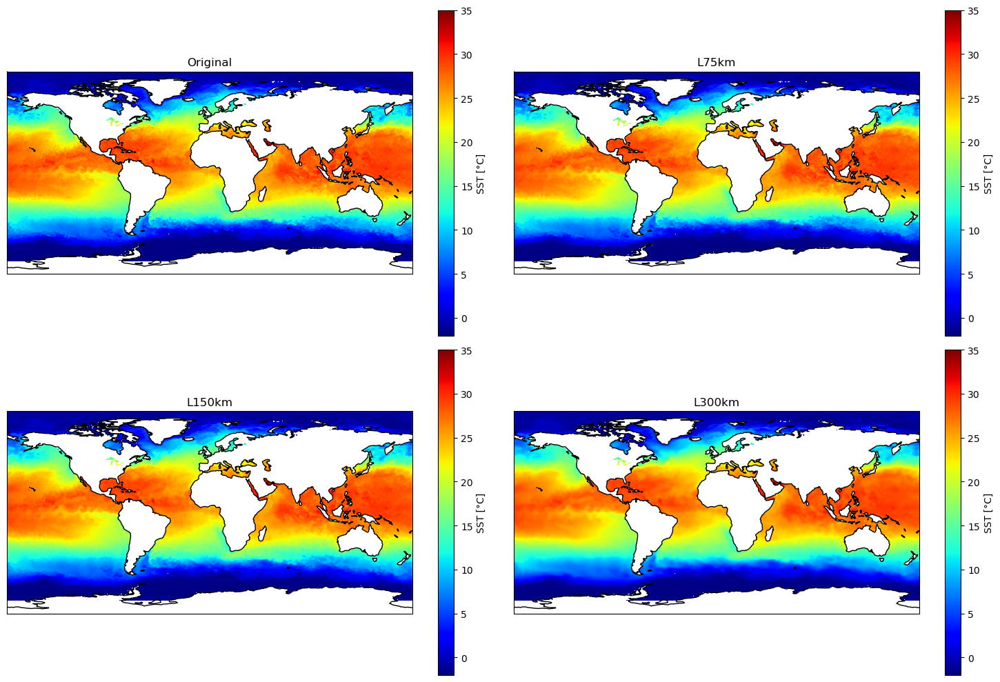

In [11]:
# First time step
t_index = 0

# Plot all four
fig, axes = plt.subplots(
    2, 2, figsize=(15, 10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

for ax, (title, da) in zip(axes.flat, paths.items()):
    da.isel(time=t_index).plot(ax=ax, cmap="jet", vmin=-2, vmax=35, cbar_kwargs={"label": "SST [°C]"})
    ax.coastlines()
    ax.set_title(title)

plt.tight_layout()
plt.show()

## Plot the Eddies (Original SST - Filtered SST)

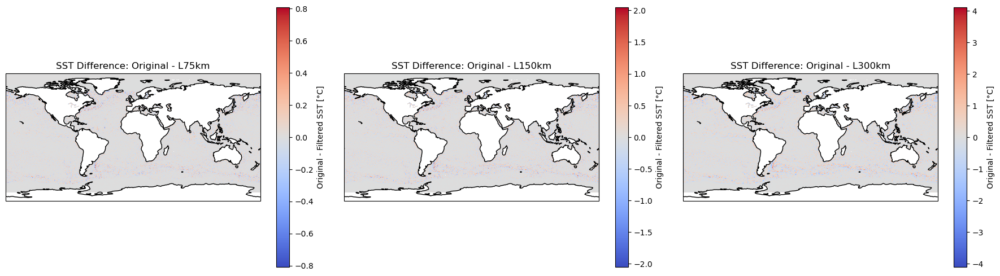

In [13]:
# Paths to your saved filtered datasets
paths_filtered = {
    "L75km": "/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L75km.nc",
    "L150km": "/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L150km.nc",
    "L300km": "/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_filtered_L300km.nc",
}

# Original SST (already loaded as ds_sst)
sst_orig = ds_sst["sst"]

# Time index to plot
t_index = 0

# Set up figure
fig, axes = plt.subplots(
    1, 3, figsize=(18, 5),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

for ax, (label, path) in zip(axes, paths_filtered.items()):
    # Load filtered data
    ds_filtered = xr.open_dataset(path)
    sst_filtered = ds_filtered[list(ds_filtered.data_vars)[0]]

    # Compute difference
    diff = sst_orig.isel(time=t_index) - sst_filtered.isel(time=t_index)

    # Plot
    diff.plot(ax=ax, cmap="coolwarm", cbar_kwargs={"label": "Original - Filtered SST [°C]"})
    ax.coastlines()
    ax.set_title(f"SST Difference: Original - {label}")

plt.tight_layout()
plt.show()